In [15]:
from satisfying_sims.audio.dynamics import agc_rms, soft_limit_tanh, lowpass
from pathlib import Path
import numpy as np
import os
from scipy.io import wavfile
from IPython.display import Audio
import matplotlib.pyplot as plt

In [2]:
project_root = Path(os.getcwd()).parent
exp_dir = project_root / "results" / "radius_2_new_margins"
audio_path = exp_dir / "video.wav"

In [3]:
#load audio to numpy array
sr, audio = wavfile.read(audio_path)

print(
    "peak:", np.max(np.abs(audio)),
    "rms:", np.sqrt(np.mean(audio**2)),
)
audio = audio.astype(np.float32) / 32768.0  # normalize int16

peak: 32767 rms: 23.21397209090474


In [4]:
def print_audio_segments(audio, num_windows=40):
    num_samples = len(audio)
    for i in range(num_windows):
        start = i * (num_samples // num_windows)
        end = (i + 1) * (num_samples // num_windows)
        segment = audio[start:end]
        print(
            f"Segment {i}:",
            "peak:", np.max(np.abs(segment)),
            "rms:", np.sqrt(np.mean(segment**2)),
        )
print_audio_segments(audio)

Segment 0: peak: 0.0052490234 rms: 0.000414126
Segment 1: peak: 0.0052490234 rms: 0.000414126
Segment 2: peak: 0.0052490234 rms: 0.0005856598
Segment 3: peak: 3.0517578e-05 rms: 1.8004074e-06
Segment 4: peak: 0.0052490234 rms: 0.000414126
Segment 5: peak: 0.005706787 rms: 0.0002648283
Segment 6: peak: 0.0052490234 rms: 0.0004141191
Segment 7: peak: 0.005279541 rms: 0.0008282749
Segment 8: peak: 0.00021362305 rms: 1.4323932e-05
Segment 9: peak: 0.0052490234 rms: 0.000414126
Segment 10: peak: 0.0 rms: 0.0
Segment 11: peak: 0.0052490234 rms: 0.000414126
Segment 12: peak: 0.0 rms: 0.0
Segment 13: peak: 0.0052490234 rms: 0.00071722816
Segment 14: peak: 0.0052490234 rms: 0.000414126
Segment 15: peak: 0.0052490234 rms: 0.000414126
Segment 16: peak: 0.0 rms: 0.0
Segment 17: peak: 0.0052490234 rms: 0.000414126
Segment 18: peak: 0.005218506 rms: 0.00050207414
Segment 19: peak: 0.0076904297 rms: 0.00046645466
Segment 20: peak: 0.0052490234 rms: 0.00066055596
Segment 21: peak: 0.006500244 rms: 0.0

In [5]:
def st_rms(x, sr, win_s=0.05):
    win = int(sr*win_s)
    x2 = x.astype(np.float32)**2
    kernel = np.ones(win, np.float32)/win
    return np.sqrt(np.convolve(x2, kernel, mode="same") + 1e-12)

r = st_rms(audio, sr, 0.05)
print("50ms RMS max:", r.max(), "median:", np.median(r))
print("peak:", np.max(np.abs(audio)))


50ms RMS max: 0.34369996 median: 1e-06
peak: 0.9999695


In [7]:
Audio(data=audio, rate=sr)

In [71]:
T = 0.004
min_gain_needed = T / 0.4
max_reduction = -20 * np.log10(min_gain_needed)
print(max_reduction)

40.0


In [72]:
audio2, gain = agc_rms(
    audio,
    sr=44100,
    target_rms=T,
    max_reduction_db=max_reduction,
    window_s=0.05,
    attack_s=0.01,
    release_s=0.25,
    max_gain=1.0,         # important: don't raise early part
)

audio3 = lowpass(audio2, sr, cutoff_hz=8000)
Audio(audio3, rate=sr)

final = soft_limit_tanh(audio3, max_amplitude=0.95)

(-0.02, 0.02)

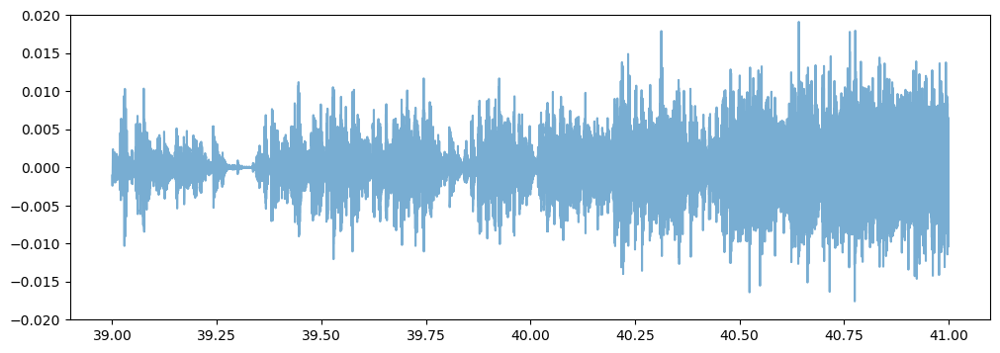

In [73]:
t=40
deltat=1
idx = int(t * sr)
plt.figure(figsize=(12,4))
t_array = np.linspace(t-deltat, t+deltat, int(2*deltat*sr+1))
plt.plot(t_array, audio2[idx-int(deltat*sr):idx+int(deltat*sr)+1], label="original", alpha=0.6)
plt.ylim([-.02, .02])

In [74]:
Audio(data=audio2, rate=sr)

In [8]:
print_audio_segments(final)

Segment 0: peak: 0.00524897 rms: 0.00041412452
Segment 1: peak: 0.00524897 rms: 0.00041412452
Segment 2: peak: 0.00524897 rms: 0.0005856577
Segment 3: peak: 3.0517578e-05 rms: 1.8004074e-06
Segment 4: peak: 0.00524897 rms: 0.00041412452
Segment 5: peak: 0.005706718 rms: 0.00026482757
Segment 6: peak: 0.00524897 rms: 0.00041411762
Segment 7: peak: 0.0052794865 rms: 0.00082827196
Segment 8: peak: 0.00021362305 rms: 1.4323932e-05
Segment 9: peak: 0.00524897 rms: 0.00041412452
Segment 10: peak: 0.0 rms: 0.0
Segment 11: peak: 0.00524897 rms: 0.00041412452
Segment 12: peak: 0.0 rms: 0.0
Segment 13: peak: 0.00524897 rms: 0.0007172256
Segment 14: peak: 0.00524897 rms: 0.00041412452
Segment 15: peak: 0.00524897 rms: 0.00041412452
Segment 16: peak: 0.0 rms: 0.0
Segment 17: peak: 0.00524897 rms: 0.00041412452
Segment 18: peak: 0.0052184532 rms: 0.0005020725
Segment 19: peak: 0.007690261 rms: 0.00046645236
Segment 20: peak: 0.00524897 rms: 0.00066055363
Segment 21: peak: 0.0065001426 rms: 0.000638

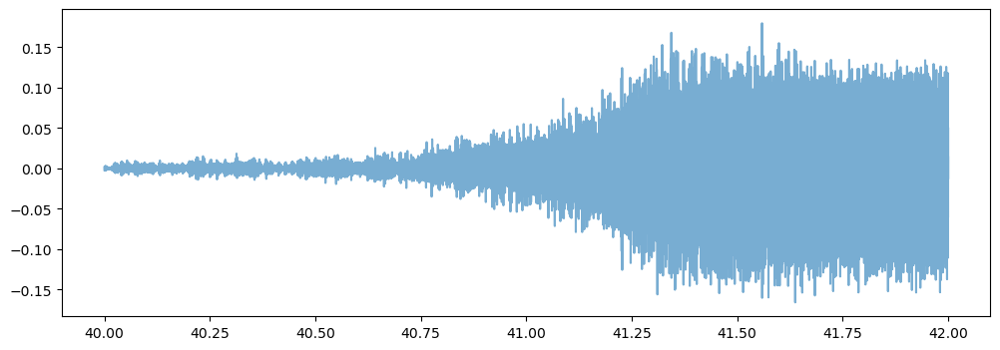

In [34]:
Audio(data=audio, rate=sr)